In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
import janitor as jn

In [1]:
import yellowbrick.features as ybf
import yellowbrick.regressor as ybr
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import *
from sklearn.model_selection import *
from sklearn.preprocessing import *
from sklearn.linear_model import *
from sklearn.datasets import *
from sklearn.ensemble import *
from sklearn.metrics import *
from sklearn.decomposition import *

In [4]:
df = pd.read_csv('../data/titanic_train.csv')
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [5]:
def tweak_titanic(df):
    df = (
        df.drop(columns=["Name", "Ticket", "Cabin"])
            .pipe(pd.get_dummies, drop_first=True)
    )
    return df

def get_train_test_X_y(df, target, size=0.3, std_cols=None):
    X, y = df.get_features_targets(target_columns=target)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=42)
    cols = X.columns
    num_cols = ["Pclass", "Age", "SibSp", "Parch", "Fare"]
    
    imp = IterativeImputer()
    fitted = imp.fit_transform(X_train[num_cols])
    
    X_train = X_train.assign(**{c:fitted[:,i] for i, c in enumerate(num_cols)})
    test_fit = imp.transform(X_test[num_cols])
    X_test = X_test.assign(**{c:test_fit[:,i] for i, c in enumerate(num_cols)})
    
    if std_cols:
        std = StandardScaler()
        fitted = std.fit_transform(X_train[std_cols])
        X_train = X_train.assign(**{c:fitted[:,i] for i, c in enumerate(std_cols)})
        test_fit = std.transform(X_test[std_cols])
        X_test = X_test.assign(**{c:test_fit[:,i] for i, c in enumerate(std_cols)})

    return X_train, X_test, y_train, y_test

ti_df = tweak_titanic(df)
std_cols = "Pclass,Age,SibSp,Fare".split(",")

target = "Survived"

X_train, X_test, y_train, y_test = get_train_test_X_y(ti_df, target, std_cols=std_cols)

X = pd.concat([X_train, X_test])
y = pd.concat([y_train, y_test])

## PCA

In [9]:
pca = PCA(random_state=42)
X_pca = pca.fit_transform(StandardScaler().fit_transform(X))
pca.explained_variance_ratio_

array([0.20582967, 0.20383376, 0.17243326, 0.11046576, 0.09327711,
       0.0726767 , 0.05865803, 0.04569492, 0.0371308 ])

In [7]:
pca.components_[0]

array([-0.08220258,  0.28329213, -0.54201933,  0.55895106,  0.49589715,
        0.02202713, -0.23396889,  0.01601554,  0.07334819])

[Text(0.5, 0, 'Component'),
 Text(0, 0.5, 'Percent of Explained variance'),
 Text(0.5, 1.0, 'Scree Plot'),
 (0.0, 1.0)]

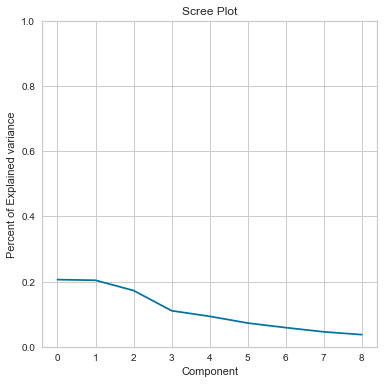

In [11]:
_, ax = plt.subplots(figsize=(6, 6))
ax.plot(pca.explained_variance_ratio_)
ax.set(
    xlabel="Component",
    ylabel="Percent of Explained variance",
    title="Scree Plot",
    ylim=(0, 1),
)

[Text(0.5, 0, 'Component'),
 Text(0, 0.5, 'Percent of Explained variance'),
 Text(0.5, 1.0, 'Cumulative Variance'),
 (0.0, 1.0)]

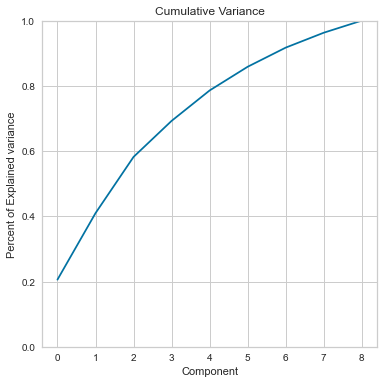

In [12]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.plot(np.cumsum(pca.explained_variance_ratio_))
ax.set(
    xlabel="Component",
    ylabel="Percent of Explained variance",
    title="Cumulative Variance",
    ylim=(0, 1),
)

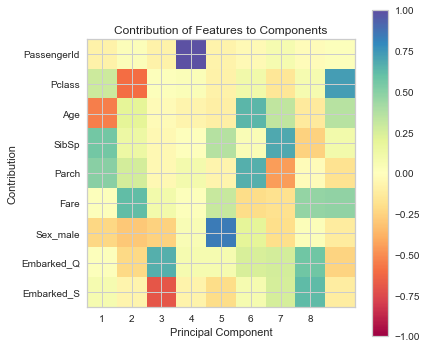

In [13]:
fig, ax = plt.subplots(figsize=(6, 6))
plt.imshow(
    pca.components_.T,
    cmap="Spectral",
    vmin=-1,
    vmax=1,
)
plt.yticks(range(len(X.columns)), X.columns)
plt.xticks(range(8), range(1, 9))
plt.xlabel("Principal Component")
plt.ylabel("Contribution")
plt.title("Contribution of Features to Components")
plt.colorbar()

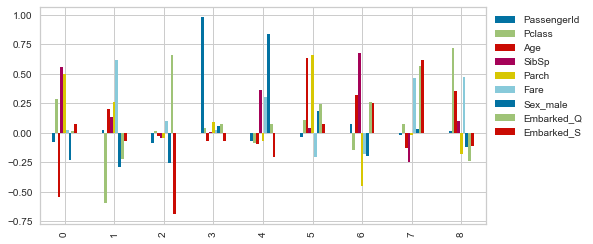

In [14]:
fig, ax = plt.subplots(figsize=(8, 4))
(
    pd.DataFrame(pca.components_, columns=X.columns)
    .plot(kind="bar", ax=ax)
    .legend(bbox_to_anchor=(1, 1))
)

In [15]:
comps = pd.DataFrame(pca.components_, columns=X.columns)
min_val = 0.5
num_components = 2
pca_cols = set()
for i in range(num_components):
    parts = comps.iloc[i][comps.iloc[i].abs() > min_val]
    pca_cols.update(set(parts.index))
pca_cols

{'Age', 'Fare', 'Pclass', 'SibSp'}

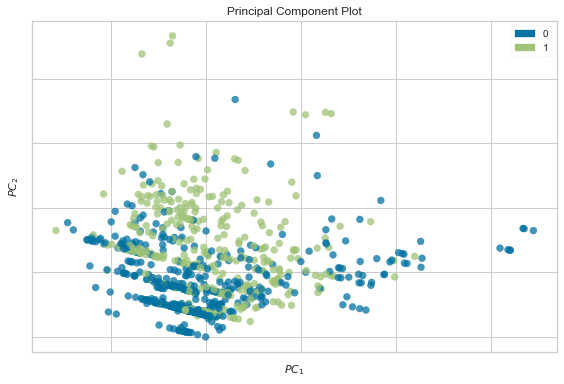

<AxesSubplot:title={'center':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [17]:
colors = ["rg"[j] for j in y]
pca_viz = ybf.pca.PCADecomposition(color=colors)
pca_viz.fit_transform(X, y)
pca_viz.poof()

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

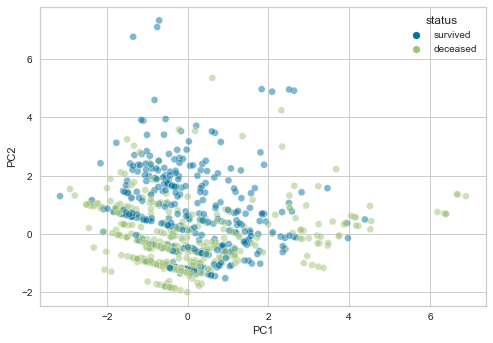

In [19]:
pca_df = pd.DataFrame(X_pca, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])
pca_df["status"] = [("deceased", "survived")[i] for i in y]
evr = pca.explained_variance_ratio_
ax.set_aspect(evr[1] / evr[0])
sns.scatterplot(
    x="PC1",
    y="PC2",
    hue="status",
    data=pca_df,
    alpha=0.5
)

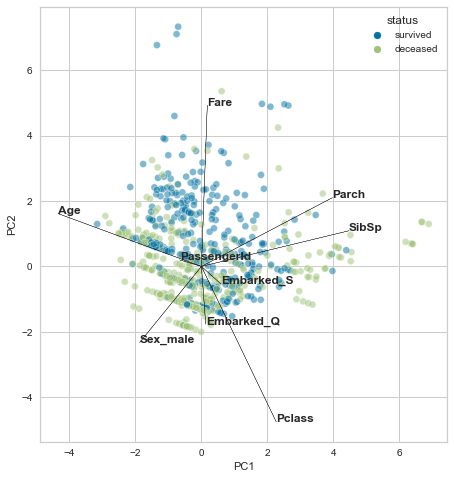

In [20]:
fig, ax = plt.subplots(figsize=(8, 8))

pca_df = pd.DataFrame(X_pca, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])
pca_df["status"] = [("deceased", "survived")[i] for i in y]
evr = pca.explained_variance_ratio_
x_idx = 0  # x_pc
y_idx = 1  # y_pc
ax.set_aspect(evr[y_idx] / evr[x_idx])
x_col = pca_df.columns[x_idx]
y_col = pca_df.columns[y_idx]

sns.scatterplot(
    x=x_col,
    y=y_col,
    hue="status",
    data=pca_df,
    alpha=0.5,
)

scale = 8
comps = pd.DataFrame(pca.components_, columns=X.columns)
for idx, s in comps.T.iterrows():
    plt.arrow(0, 0, s[x_idx] * scale, s[y_idx] * scale, color="k")
    plt.text(s[x_idx] * scale, s[y_idx] * scale, idx, weight="bold",
    )

<AxesSubplot:xlabel='PC1', ylabel='PC4'>

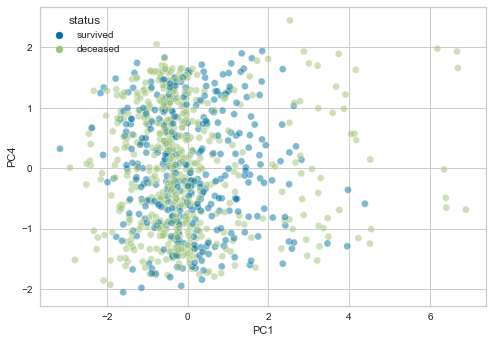

In [21]:
pca_df = pd.DataFrame(X_pca, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])
pca_df["status"] = [("deceased", "survived")[i] for i in y]
evr = pca.explained_variance_ratio_
ax.set_aspect(evr[3] / evr[0])
sns.scatterplot(
    x="PC1",
    y="PC4",
    hue="status",
    data=pca_df,
    alpha=0.5,
)

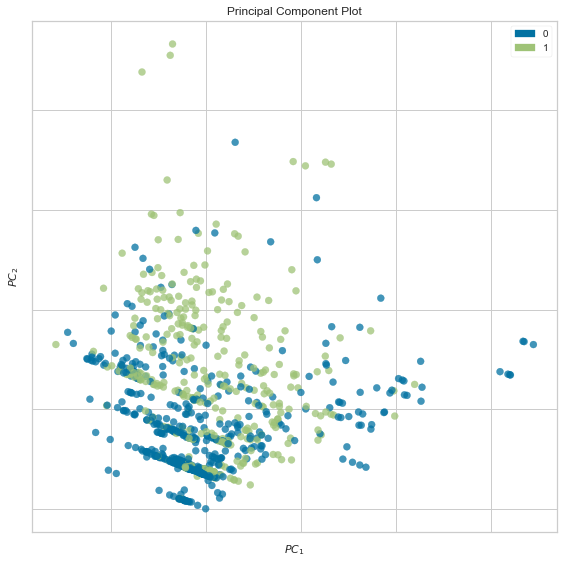

In [30]:
fig = plt.figure(figsize=(8, 8))

colors = ["rg"[j] for j in y]
pca3_viz = ybf.pca.PCADecomposition(proj_dim=3, color=colors)
pca3_viz.fit_transform(X, y)
pca3_viz.finalize()
plt.tight_layout()

In [48]:
import scprep

scprep.plot.rotate_scatter3d(
    X_pca[:, :3], 
    c=y, 
    cmap="Spectral", 
    figsize=(8, 6), 
    label_prefix="Principal Component"
)

Text(0.5, 0, 'PC 3')

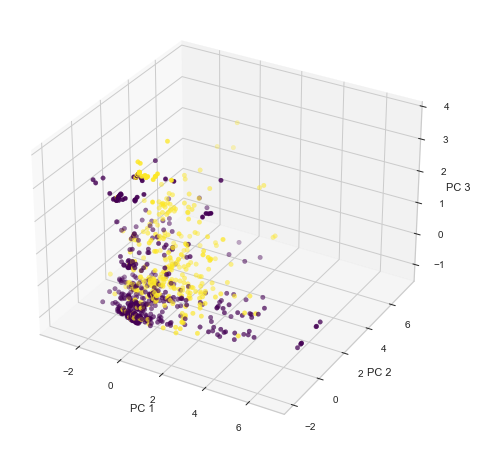

In [29]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(
    xs=X_pca[:, 0],
    ys=X_pca[:, 1],
    zs=X_pca[:, 2],
    c=y,
    cmap="viridis",
)
ax.set_xlabel("PC 1")
ax.set_ylabel("PC 2")
ax.set_zlabel("PC 3")

## UMAP

In [31]:
import umap

In [32]:
u = umap.UMAP(random_state=42)
X_umap = u.fit_transform(StandardScaler().fit_transform(X))
X_umap.shape

(891, 2)

<AxesSubplot:xlabel='0', ylabel='1'>

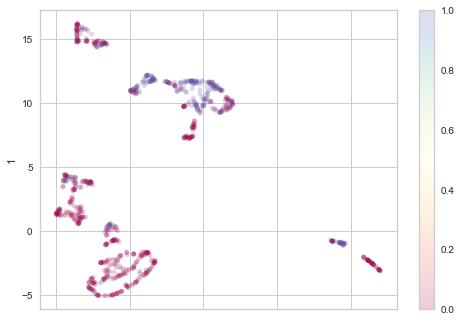

In [33]:
pd.DataFrame(X_umap).plot(kind="scatter", x=0, y=1, c=y, alpha=0.2, cmap="Spectral")

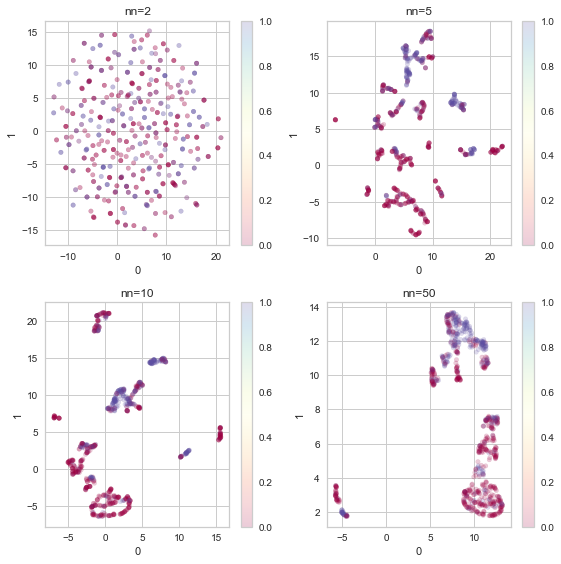

In [35]:
X_std = StandardScaler().fit_transform(X)
_, axes = plt.subplots(2, 2, figsize=(8, 8))

axes = axes.reshape(4)

for i, n in enumerate([2, 5, 10, 50]):
    ax = axes[i]
    u = umap.UMAP(random_state=42, n_neighbors=n)
    X_umap = u.fit_transform(X_std)
    pd.DataFrame(X_umap).plot(kind="scatter", x=0, y=1, c=y, alpha=0.2, cmap="Spectral", ax=ax)
    ax.set_title(f"nn={n}")
    
plt.tight_layout()

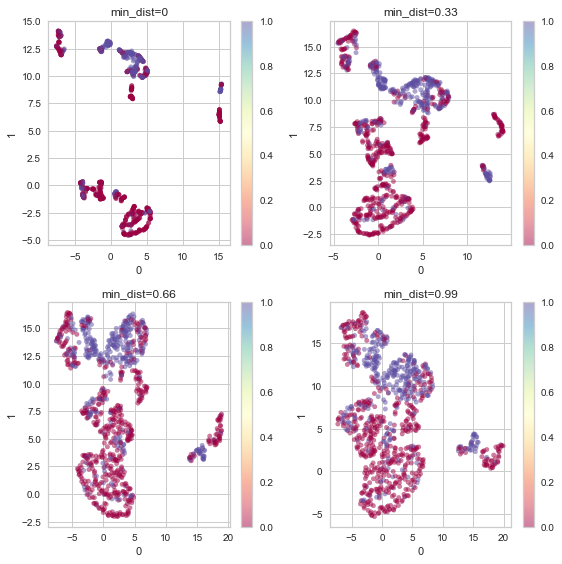

In [36]:
_, axes = plt.subplots(2, 2, figsize=(8, 8))
axes = axes.reshape(4)

for i, n in enumerate([0, 0.33, 0.66, 0.99]):
    ax = axes[i]
    u = umap.UMAP(random_state=42, min_dist=n)
    X_umap = u.fit_transform(X_std)
    pd.DataFrame(X_umap).plot(kind="scatter", x=0, y=1, c=y, alpha=0.5, cmap="Spectral", ax=ax)
    ax.set_title(f"min_dist={n}")
    
plt.tight_layout()

## t-SNE

In [37]:
from sklearn.manifold import TSNE

In [42]:
X_std = StandardScaler().fit_transform(X)
ts = TSNE()
X_tsne = ts.fit_transform(X_std)

Text(0, 0.5, 'Embedding 2')

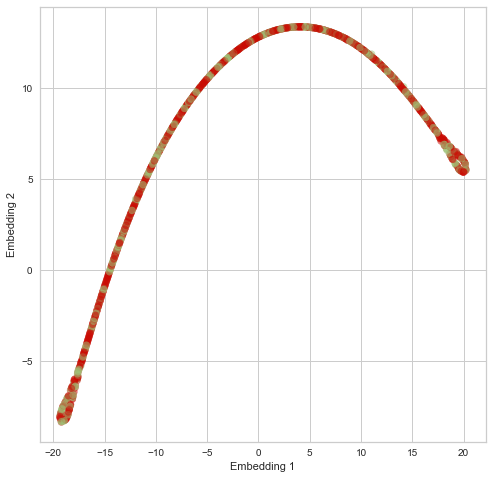

In [47]:
_, axes = plt.subplots(figsize=(8, 8))

colors = ["rg"[j] for j in y]
scat = axes.scatter(
    X_tsne[:, 0],
    X_tsne[:, 1],
    c=colors,
    alpha=0.5
)
axes.set_xlabel("Embedding 1")
axes.set_ylabel("Embedding 2")
#fig.savefig("images/mlpr_1716.png", dpi=300)

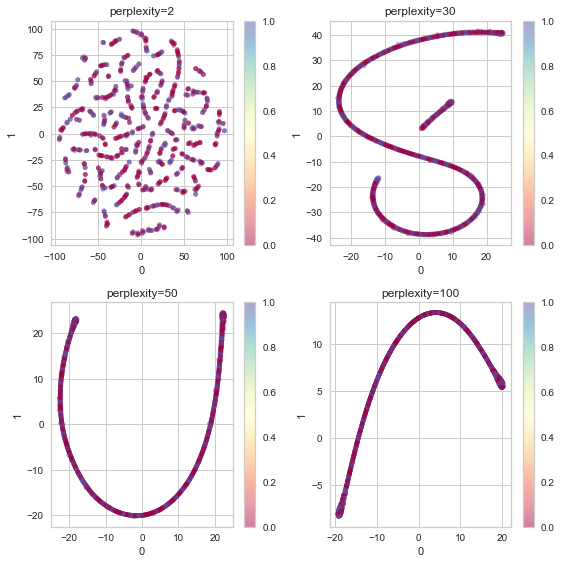

In [44]:
_, axes = plt.subplots(2, 2, figsize=(8, 8))
axes = axes.reshape(4)

for i, n in enumerate((2, 30, 50, 100)):
    ax = axes[i]
    t = TSNE(random_state=42, perplexity=n)
    X_tsne = t.fit_transform(X)
    pd.DataFrame(X_tsne).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5,
    )
    ax.set_title(f"perplexity={n}")
    
plt.tight_layout()